In [1]:
import netCDF4 as nc
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import scipy
import tqdm
import matplotlib.colors as mcolors
from helpers import process_h as helper
from helpers import visualize_h as vis_helper
import skill_metrics as sm
import pysteps
import pandas as pd

Pysteps configuration file found at: /root/.pyenv/versions/3.10.11/envs/dsproj/lib/python3.10/site-packages/pysteps/pystepsrc



In [2]:
data_relative_path = os.path.join('..', 'Data')
precipitation_path = os.path.join(data_relative_path,'CMIP6','Precipitation')
WTIO_path = os.path.join(data_relative_path,'CMIP6','WTIO')
SEIO_path = os.path.join(data_relative_path,'CMIP6','SEIO')
CHIRPS_path = os.path.join(data_relative_path,'CHIRPS2')
SLP_path = os.path.join(data_relative_path,'CMIP6','SLP')
GPH500_path = os.path.join(data_relative_path,'CMIP6', 'GPH500')
ERA5_path = os.path.join(data_relative_path, 'ERA5')

In [3]:
dmi_baseline = scipy.io.loadmat(f"{data_relative_path}/DMI/DMI.mat")['DMI_Oct_1981_2022'][:, 1][:30]

In [4]:
precip_baseline = ((nc.Dataset(f"{CHIRPS_path}/CHIRPS_Monthly_precipitation.nc")['precip'][:])[9::12, 280:360, 800:920])[:30, :, :]

In [5]:
gph500_baseline = np.squeeze((nc.Dataset(f"{ERA5_path}/GPH500_ERA5.nc"))['z'][:], axis=1)

In [6]:
mslp_baseline = (nc.Dataset(f"{ERA5_path}/MSLP_ERA5.nc"))['msl'][:]

In [7]:
# Converting units needed for converting models precipitation measurements
unit_conversion = 86400 * 31
# Map latitude and longitude boundaries
bounds_middle_east_lat = [20, 40]
bounds_middle_east_lon = [20, 50]
boundaries_middle_east = bounds_middle_east_lon + bounds_middle_east_lat
bounds_general_lat = [-20, 50]
bounds_general_lon = [-10, 110]
boundaries_general = bounds_general_lon + bounds_general_lat
# A dimension we want our grid to have
dim = (16, 16)
chirps_dim = precip_baseline.shape[1], precip_baseline.shape[2]
era5_dim = gph500_baseline.shape[1], gph500_baseline.shape[2]

First we need to load the data.

In [8]:
wtio = helper.collect_all_datasets(WTIO_path, 'wtio')
seio = helper.collect_all_datasets(SEIO_path, 'seio')

 38%|██████████████████████████████████▏                                                        | 9/24 [00:00<00:00, 51.53it/s]

tos_Omon_ACCESS-CM2_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
tos_Omon_CAMS-CSM1-0_historical_r1i1p1f1_gn_19811016-20101016_v20190708.nc
tos_Omon_CanESM5-CanOE_historical_r1i1p2f1_gn_19811016-20101016_v20190429.nc
tos_Omon_CMCC-CM2-HR4_historical_r1i1p1f1_gn_19811016-20101016_v20200904.nc
tos_Omon_CNRM-CM6-1-HR_historical_r1i1p1f2_gn_19811016-20101016_v20191021.nc
tos_Omon_E3SM-1-0_historical_r1i1p1f1_gr_19811016-20101016_v20190826.nc
tos_Omon_EC-Earth3-AerChem_historical_r1i1p1f1_gn_19811016-20101016_v20200624.nc
tos_Omon_FGOALS-f3-L_historical_r1i1p1f1_gn_19811016-20101016_v20191007.nc
tos_Omon_FIO-ESM-2-0_historical_r1i1p1f1_gn_19811016-20101016_v20191122.nc
tos_Omon_GFDL-ESM4_historical_r1i1p1f1_gr_19811016-20101016_v20190726.nc
tos_Omon_GISS-E2-1-H_historical_r1i1p1f1_gn_19811016-20101016_v20190403.nc
tos_Omon_HadGEM3-GC31-LL_historical_r1i1p1f3_gn_19811016-20101016_v20190624.nc
tos_Omon_IITM-ESM_historical_r1i1p1f1_gn_19811016-20101016_v20200915.nc


100%|██████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 67.70it/s]


tos_Omon_INM-CM5-0_historical_r1i1p1f1_gr1_19811016-20101016_v20190610.nc
tos_Omon_IPSL-CM6A-LR_historical_r1i1p1f1_gn_19811016-20101016_v20180803.nc
tos_Omon_MCM-UA-1-0_historical_r0i0p0f2_gn_19811017-20101017_v20190731.nc
tos_Omon_MIROC6_historical_r1i1p1f1_gn_19811016-20101016_v20181212.nc
tos_Omon_MPI-ESM1-2-HR_historical_r1i1p1f1_gn_19811016-20101016_v20190710.nc
tos_Omon_MRI-ESM2-0_historical_r1i1p1f1_gr_19811016-20101016_v20190904.nc
tos_Omon_NESM3_historical_r1i1p1f1_gn_19811016-20101016_v20190703.nc
tos_Omon_NorESM2-MM_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
tos_Omon_SAM0-UNICON_historical_r1i1p1f1_gn_19811016-20101016_v20190323.nc
tos_Omon_TaiESM1_historical_r1i1p1f1_gn_19811016-20101016_v20200630.nc
tos_Omon_UKESM1-0-LL_historical_r1i1p1f2_gn_19811016-20101016_v20190627.nc


  0%|                                                                                                   | 0/24 [00:00<?, ?it/s]

tos_Omon_ACCESS-CM2_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
tos_Omon_CAMS-CSM1-0_historical_r1i1p1f1_gn_19811016-20101016_v20190708.nc
tos_Omon_CanESM5-CanOE_historical_r1i1p2f1_gn_19811016-20101016_v20190429.nc
tos_Omon_CMCC-CM2-HR4_historical_r1i1p1f1_gn_19811016-20101016_v20200904.nc


 83%|███████████████████████████████████████████████████████████████████████████               | 20/24 [00:00<00:00, 97.82it/s]

tos_Omon_CNRM-CM6-1-HR_historical_r1i1p1f2_gn_19811016-20101016_v20191021.nc
tos_Omon_E3SM-1-0_historical_r1i1p1f1_gr_19811016-20101016_v20190826.nc
tos_Omon_EC-Earth3-AerChem_historical_r1i1p1f1_gn_19811016-20101016_v20200624.nc
tos_Omon_FGOALS-f3-L_historical_r1i1p1f1_gn_19811016-20101016_v20191007.nc
tos_Omon_FIO-ESM-2-0_historical_r1i1p1f1_gn_19811016-20101016_v20191122.nc
tos_Omon_GFDL-ESM4_historical_r1i1p1f1_gr_19811016-20101016_v20190726.nc
tos_Omon_GISS-E2-1-H_historical_r1i1p1f1_gn_19811016-20101016_v20190403.nc
tos_Omon_HadGEM3-GC31-LL_historical_r1i1p1f3_gn_19811016-20101016_v20190624.nc
tos_Omon_IITM-ESM_historical_r1i1p1f1_gn_19811016-20101016_v20200915.nc
tos_Omon_INM-CM5-0_historical_r1i1p1f1_gr1_19811016-20101016_v20190610.nc
tos_Omon_IPSL-CM6A-LR_historical_r1i1p1f1_gn_19811016-20101016_v20180803.nc
tos_Omon_MCM-UA-1-0_historical_r0i0p0f2_gn_19811017-20101017_v20190731.nc
tos_Omon_MIROC6_historical_r1i1p1f1_gn_19811016-20101016_v20181212.nc
tos_Omon_MPI-ESM1-2-HR_hist

100%|██████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 86.97it/s]

tos_Omon_UKESM1-0-LL_historical_r1i1p1f2_gn_19811016-20101016_v20190627.nc


In [9]:
options = {"interpolate": True,
           "force grid": False,
           "average": False}

In [10]:
precip  = helper.collect_all_datasets(precipitation_path, 'precip', chirps_dim, unit_conversion, bounds_middle_east_lat, bounds_middle_east_lon, options)

  0%|                                                                                                   | 0/24 [00:00<?, ?it/s]

pr_Amon_ACCESS-CM2_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
(30, 16, 16)


  4%|███▊                                                                                       | 1/24 [00:00<00:05,  3.86it/s]

pr_Amon_CAMS-CSM1-0_historical_r1i1p1f1_gn_19811016-20101016_v20190708.nc
(30, 18, 27)


  8%|███████▌                                                                                   | 2/24 [00:00<00:05,  3.79it/s]

pr_Amon_CanESM5-CanOE_historical_r1i1p2f1_gn_19811016-20101016_v20190429.nc
(30, 7, 10)


 12%|███████████▍                                                                               | 3/24 [00:00<00:05,  3.74it/s]

pr_Amon_CMCC-CM2-HR4_historical_r1i1p1f1_gn_19811016-20101016_v20200904.nc
(30, 21, 25)


 17%|███████████████▏                                                                           | 4/24 [00:01<00:06,  3.20it/s]

pr_Amon_CNRM-CM6-1-HR_historical_r1i1p1f2_gr_19811016-20101016_v20191021.nc
(30, 40, 61)


 21%|██████████████████▉                                                                        | 5/24 [00:01<00:06,  2.86it/s]

pr_Amon_E3SM-1-0_historical_r1i1p1f1_gr_19811016-20101016_v20190913.nc
(30, 20, 30)


 25%|██████████████████████▊                                                                    | 6/24 [00:01<00:05,  3.07it/s]

pr_Amon_EC-Earth3-AerChem_historical_r1i1p1f1_gr_19811016-20101016_v20200624.nc
(30, 28, 43)


 29%|██████████████████████████▌                                                                | 7/24 [00:02<00:05,  3.11it/s]

pr_Amon_FGOALS-f3-L_historical_r1i1p1f1_gr_19811016-20101016_v20190927.nc
(30, 20, 24)


 33%|██████████████████████████████▎                                                            | 8/24 [00:02<00:04,  3.29it/s]

pr_Amon_FIO-ESM-2-0_historical_r1i1p1f1_gn_19811016-20101016_v20191209.nc
(30, 21, 25)


 38%|██████████████████████████████████▏                                                        | 9/24 [00:02<00:04,  3.30it/s]

pr_Amon_GFDL-ESM4_historical_r1i1p1f1_gr1_19811016-20101016_v20190726.nc
(30, 20, 24)


 42%|█████████████████████████████████████▌                                                    | 10/24 [00:03<00:04,  3.38it/s]

pr_Amon_GISS-E2-1-H_historical_r1i1p1f1_gn_19811016-20101016_v20190403.nc
(30, 10, 12)


 46%|█████████████████████████████████████████▎                                                | 11/24 [00:03<00:03,  3.65it/s]

pr_Amon_HadGEM3-GC31-LL_historical_r1i1p1f3_gn_19811016-20101016_v20190624.nc
(30, 16, 16)


 50%|█████████████████████████████████████████████                                             | 12/24 [00:03<00:03,  3.71it/s]

pr_Amon_IITM-ESM_historical_r1i1p1f1_gn_19811016-20101016_v20191226.nc
(30, 10, 16)


 54%|████████████████████████████████████████████████▊                                         | 13/24 [00:03<00:02,  3.84it/s]

pr_Amon_INM-CM5-0_historical_r1i1p1f1_gr1_19811016-20101016_v20190610.nc
(30, 14, 16)


 58%|████████████████████████████████████████████████████▌                                     | 14/24 [00:04<00:02,  3.90it/s]

pr_Amon_IPSL-CM6A-LR_historical_r1i1p1f1_gr_19811016-20101016_v20180803.nc
(30, 16, 13)


 62%|████████████████████████████████████████████████████████▎                                 | 15/24 [00:04<00:02,  3.99it/s]

pr_Amon_MCM-UA-1-0_historical_r1i1p1f2_gn_19811017-20101017_v20191017.nc
(30, 9, 8)


 67%|████████████████████████████████████████████████████████████                              | 16/24 [00:04<00:01,  4.10it/s]

pr_Amon_MIROC6_historical_r1i1p1f1_gn_19811016-20101016_v20181212.nc
(30, 15, 21)


 71%|███████████████████████████████████████████████████████████████▊                          | 17/24 [00:04<00:01,  4.05it/s]

pr_Amon_MPI-ESM1-2-HR_historical_r1i1p1f1_gn_19811016-20101016_v20190710.nc
(30, 22, 32)


 75%|███████████████████████████████████████████████████████████████████▌                      | 18/24 [00:04<00:01,  3.92it/s]

pr_Amon_MRI-ESM2-0_historical_r1i1p1f1_gn_19811016-20101016_v20190222.nc
(30, 18, 27)


 79%|███████████████████████████████████████████████████████████████████████▎                  | 19/24 [00:05<00:01,  3.87it/s]

pr_Amon_NESM3_historical_r1i1p1f1_gn_19811016-20101016_v20190630.nc
(30, 10, 16)


 83%|███████████████████████████████████████████████████████████████████████████               | 20/24 [00:05<00:01,  3.92it/s]

pr_Amon_NorESM2-MM_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
(30, 21, 25)


 88%|██████████████████████████████████████████████████████████████████████████████▊           | 21/24 [00:05<00:00,  3.88it/s]

pr_Amon_SAM0-UNICON_historical_r1i1p1f1_gn_19811016-20101016_v20190323.nc
(30, 21, 25)


 92%|██████████████████████████████████████████████████████████████████████████████████▌       | 22/24 [00:06<00:00,  3.89it/s]

pr_Amon_TaiESM1_historical_r1i1p1f1_gn_19811016-20101016_v20200623.nc
(30, 21, 25)


 96%|██████████████████████████████████████████████████████████████████████████████████████▎   | 23/24 [00:06<00:00,  3.81it/s]

pr_Amon_UKESM1-0-LL_historical_r1i1p1f2_gn_19811016-20101016_v20190406.nc
(30, 16, 16)


100%|██████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:06<00:00,  3.66it/s]


In [11]:
lats, lons = {key: val[1] for key, val in precip.items()}, {key: val[2] for key, val in precip.items()}
precip = {key: val[0] for key, val in precip.items()}

In [12]:
masked_precip = {key: np.ma.array(val, mask=precip_baseline.mask) for key, val in precip.items()}

In [13]:
dmi = helper.calc_dmi(wtio, seio, 'anomaly grid - mean first')

100%|█████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 159.84it/s]


In [14]:
corrs = dict()

for key in tqdm.tqdm(masked_precip.keys()):
    corr_mat = helper.calc_dmi_precp_corr_vec(dmi[key], masked_precip[key])
    corrs[key] = corr_mat

100%|█████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 133.20it/s]


In [15]:
alpha = 0.05
tested_corrs = {key: np.where(helper.calc_corr_t_test(corr_map) > alpha, 0, corr_map) for key, corr_map in corrs.items()}

In [16]:
corr_baseline = helper.calc_dmi_precp_corr_vec(dmi_baseline, precip_baseline)
tested_corr_baseline = np.where(helper.calc_corr_t_test(corr_baseline) > alpha, 0, corr_baseline)

# With T-test

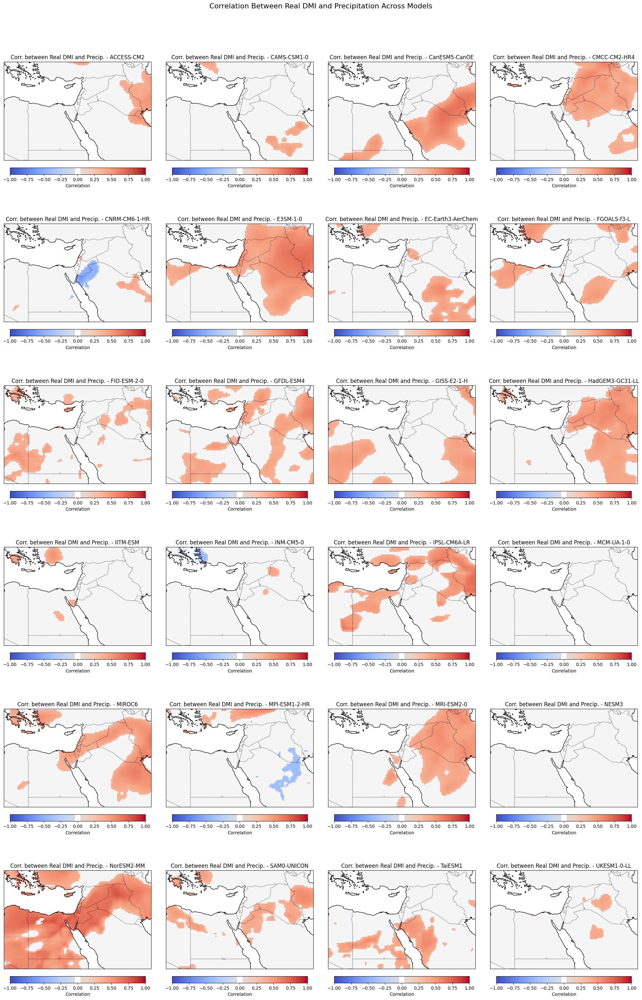

In [17]:
fig, axes = plt.subplots(6, 4, figsize=(20, 30), subplot_kw={'projection': ccrs.PlateCarree()})
fig.tight_layout()
mats = list(tested_corrs.values())
titles = list(tested_corrs.keys())


for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
    vis_helper.plot_corr_heatmap_rigid(ax, value, boundaries_middle_east, 'Correlation between DMI and Precipitation', f'Corr. between Real DMI and Precip. - {key}', 0)

fig.suptitle('Correlation Between Real DMI and Precipitation Across Models', fontsize=16, y=1.02)    
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

lets look at the real correlation

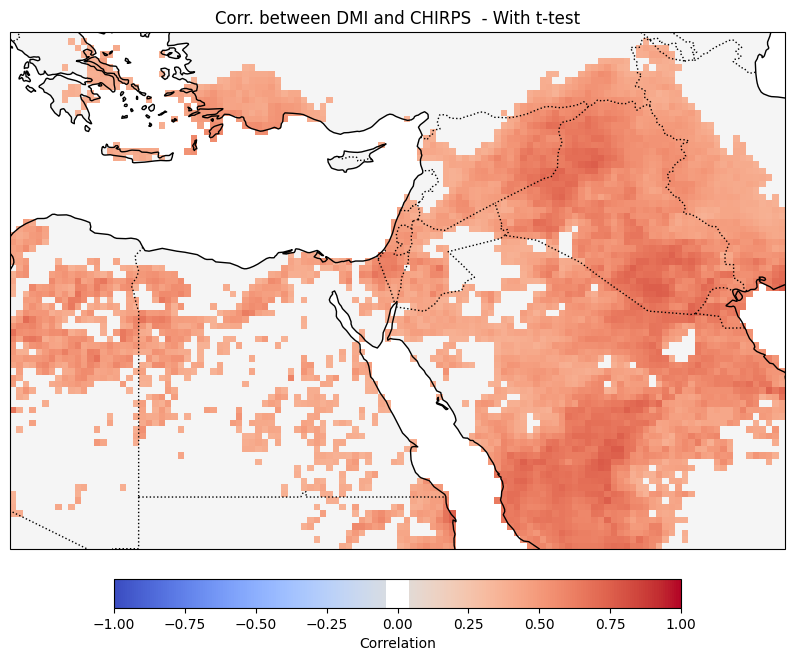

In [18]:
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
vis_helper.plot_corr_heatmap_rigid(ax, tested_corr_baseline, boundaries_middle_east, 'Correlation between DMI and Precipitation', 'Corr. between DMI and CHIRPS  - With t-test', 0)


# Without T-Test

In [19]:
# fig, axes = plt.subplots(6, 4, figsize=(20, 30), subplot_kw={'projection': ccrs.PlateCarree()})
# fig.tight_layout()
# mats = list(corrs.values())
# titles = list(corrs.keys())


# for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
#     vis_helper.plot_corr_heatmap_rigid(ax, value, boundaries_middle_east, 'Correlation between DMI and Precipitation', f'Corr. between Real DMI and Precip. - {key}', 0)
# plt.subplots_adjust(wspace=0.1, hspace=0.1)
# plt.show()

Again, real correlation for comparison

In [20]:
# fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
# vis_helper.plot_corr_heatmap_rigid(ax, corr_baseline, boundaries_middle_east, 'Correlation between DMI and Precipitation', 'Corr. between DMI and CHIRPS - Without t-test', 0)


In [21]:
avg_corrs = np.array([np.nanmean(corr_map) for key, corr_map in tested_corrs.items()])

In [22]:
stds = np.array([np.nanstd(dmi_arr) for key, dmi_arr in dmi.items()])

In [23]:
baseline_sd = np.nanstd(dmi_baseline)

In [24]:
avg_corr_baseline = np.mean(tested_corr_baseline)

In [25]:
rmsds = []
for key, dmi_arr in dmi.items():
    rmsds.append(sm.centered_rms_dev(dmi_arr, dmi_baseline))
    
rmsds = np.array(rmsds)

In [26]:
labels = list(corrs.keys())

In [27]:
avg_corrs = np.array([avg_corr_baseline] + avg_corrs.tolist())
stds = np.array ([baseline_sd] + stds.tolist()) # [baseline_sd].extend(stds)
rmsds = np.array([0] + rmsds.tolist()) #[0].extend(rmsds)
labels = ['Baseline'] + labels

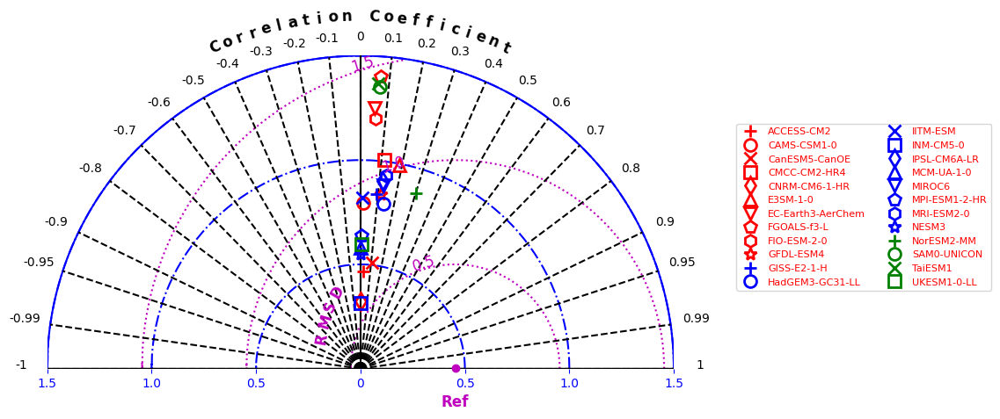

In [28]:
fig, ax = plt.subplots(figsize=(15, 6))
sm.taylor_diagram(stds, rmsds, avg_corrs, markerLabel = labels, markerLegend = 'on',
                  markerLabelColor = 'r', 
                  colRMS = 'm', styleRMS = ':', 
                  colSTD = 'b', styleSTD = '-.', 
                  colCOR = 'k', styleCOR = '--',
                 markerobs = 'o', titleOBS = 'Ref',
                  titleSTD ='on',
                 alpha = 0)

In [29]:
for i, key in enumerate(labels):
    print(f"AVG. Correlation in Model {key} - {round(avg_corrs[i], 2)}")

AVG. Correlation in Model Baseline - 0.23
AVG. Correlation in Model ACCESS-CM2 - 0.03
AVG. Correlation in Model CAMS-CSM1-0 - 0.02
AVG. Correlation in Model CanESM5-CanOE - 0.11
AVG. Correlation in Model CMCC-CM2-HR4 - 0.11
AVG. Correlation in Model CNRM-CM6-1-HR - -0.0
AVG. Correlation in Model E3SM-1-0 - 0.19
AVG. Correlation in Model EC-Earth3-AerChem - 0.05
AVG. Correlation in Model FGOALS-f3-L - 0.07
AVG. Correlation in Model FIO-ESM-2-0 - 0.06
AVG. Correlation in Model GFDL-ESM4 - 0.11
AVG. Correlation in Model GISS-E2-1-H - 0.09
AVG. Correlation in Model HadGEM3-GC31-LL - 0.14
AVG. Correlation in Model IITM-ESM - 0.01
AVG. Correlation in Model INM-CM5-0 - -0.0
AVG. Correlation in Model IPSL-CM6A-LR - 0.12
AVG. Correlation in Model MCM-UA-1-0 - 0.0
AVG. Correlation in Model MIROC6 - 0.12
AVG. Correlation in Model MPI-ESM1-2-HR - 0.0
AVG. Correlation in Model MRI-ESM2-0 - 0.13
AVG. Correlation in Model NESM3 - 0.0
AVG. Correlation in Model NorESM2-MM - 0.3
AVG. Correlation in Mode

In [30]:
max_corrs = np.array([np.nanmax(corr_map) for key, corr_map in tested_corrs.items()])
max_corr_baseline = np.max(tested_corr_baseline)
max_corrs = np.array([max_corr_baseline] + max_corrs.tolist())


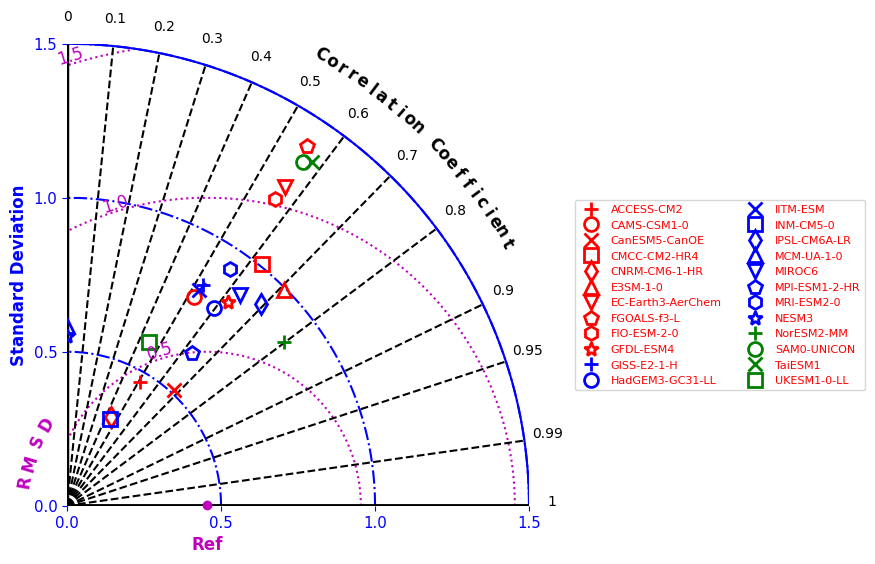

In [31]:
fig, ax = plt.subplots(figsize=(15, 6))
sm.taylor_diagram(stds, rmsds, max_corrs, markerLabel = labels, markerLegend = 'on',
                  markerLabelColor = 'r', 
                  colRMS = 'm', styleRMS = ':', 
                  colSTD = 'b', styleSTD = '-.', 
                  colCOR = 'k', styleCOR = '--',
                 markerobs = 'o', titleOBS = 'Ref',
                  titleSTD ='on',
                 alpha = 0)

In [32]:
for i, key in enumerate(labels):
    print(f"Max Correlation in Model {key} - {round(max_corrs[i], 2)}")

Max Correlation in Model Baseline - 0.77
Max Correlation in Model ACCESS-CM2 - 0.51
Max Correlation in Model CAMS-CSM1-0 - 0.52
Max Correlation in Model CanESM5-CanOE - 0.68
Max Correlation in Model CMCC-CM2-HR4 - 0.63
Max Correlation in Model CNRM-CM6-1-HR - 0.44
Max Correlation in Model E3SM-1-0 - 0.71
Max Correlation in Model EC-Earth3-AerChem - 0.56
Max Correlation in Model FGOALS-f3-L - 0.56
Max Correlation in Model FIO-ESM-2-0 - 0.56
Max Correlation in Model GFDL-ESM4 - 0.62
Max Correlation in Model GISS-E2-1-H - 0.52
Max Correlation in Model HadGEM3-GC31-LL - 0.6
Max Correlation in Model IITM-ESM - 0.52
Max Correlation in Model INM-CM5-0 - 0.44
Max Correlation in Model IPSL-CM6A-LR - 0.69
Max Correlation in Model MCM-UA-1-0 - 0.0
Max Correlation in Model MIROC6 - 0.63
Max Correlation in Model MPI-ESM1-2-HR - 0.63
Max Correlation in Model MRI-ESM2-0 - 0.57
Max Correlation in Model NESM3 - 0.0
Max Correlation in Model NorESM2-MM - 0.8
Max Correlation in Model SAM0-UNICON - 0.57
Ma

Lets look at the correlation diffs to see how they compare to the baseline.

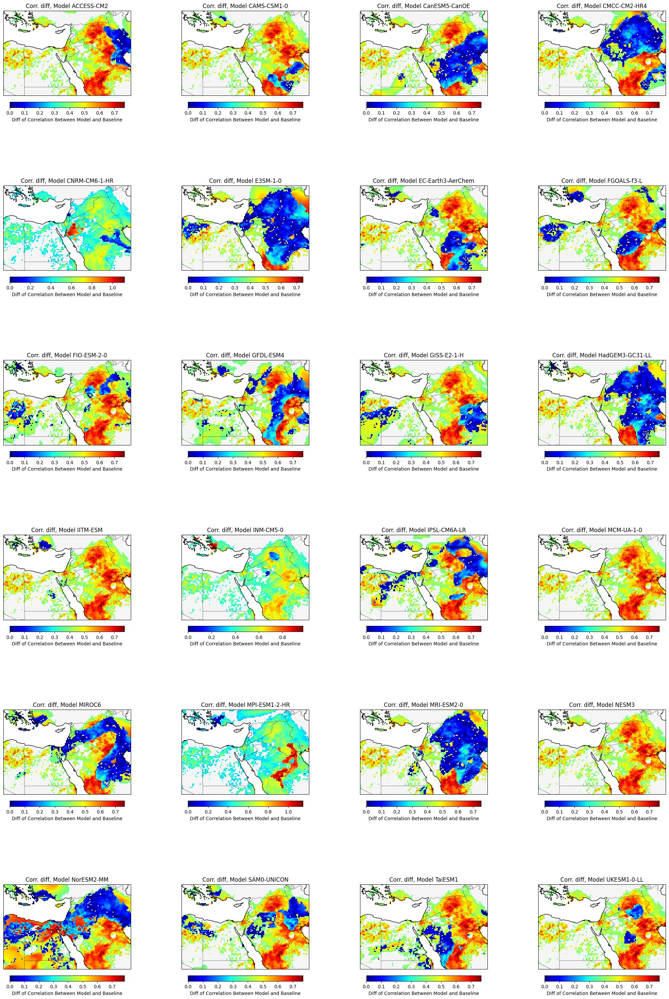

In [33]:
fig4, axes4 = plt.subplots(6, 4, figsize=(20, 30), subplot_kw={'projection': ccrs.PlateCarree()})
fig4.tight_layout()
mats = [np.abs(tested_corr_baseline - arr) for arr in list(tested_corrs.values())]
titles = list(tested_corrs.keys())

for i, (ax, key, value) in enumerate(zip(axes4.ravel(), titles, mats)):
    vis_helper.plot_precp_heatmap(ax, value, boundaries_middle_east, 'Diff of Correlation Between Model and Baseline', f'Corr. diff, Model {key}', 0)

plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

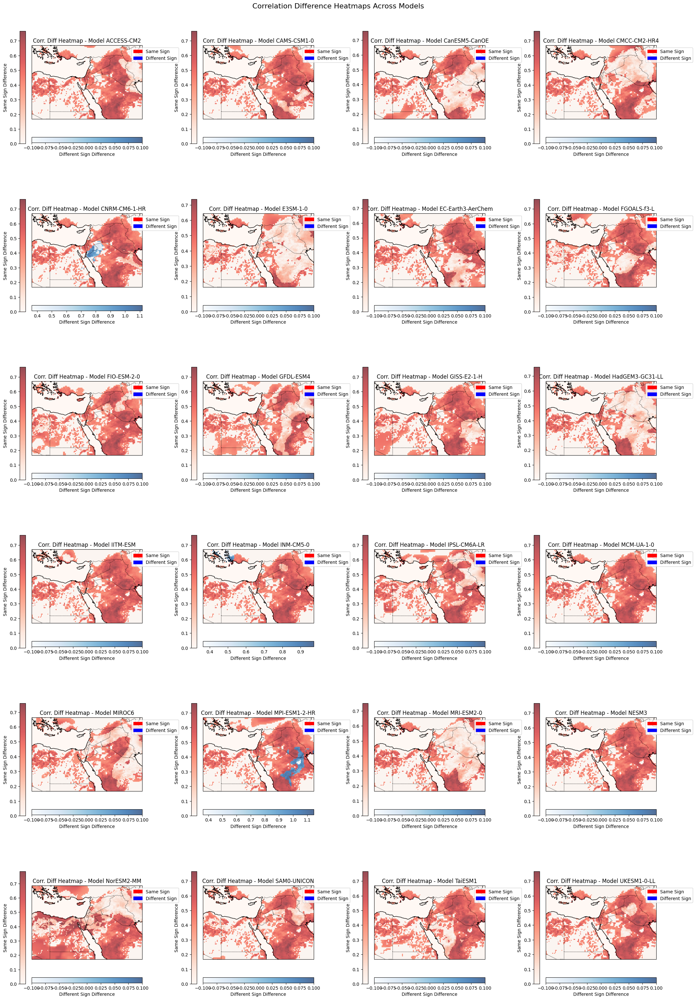

In [34]:
fig, axes = plt.subplots(6, 4, figsize=(20, 30), subplot_kw={'projection': ccrs.PlateCarree()})
fig.tight_layout()
mats, titles = helper.create_corr_diff_mats(tested_corr_baseline, tested_corrs)

for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
    vis_helper.plot_corr_diff(ax, value[0], value[1], boundaries_middle_east, label='Difference', title=f'Corr. Diff Heatmap - Model {key}')

fig.suptitle('Correlation Difference Heatmaps Across Models', fontsize=16, y=1.02)    
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

# DMI POS/NEG Effect on Precipitation

In the next part we will check if Positive DMI actually creates more rainfall.
We will begin by marking each DMI year as either positive or negative.

In [35]:
dmi_pos_neg = {key: np.where(dmi_arr >= 0, True, False) for key, dmi_arr in dmi.items()}

In [36]:
precip_diff_dmi = dict()
for key in tqdm.tqdm(masked_precip.keys()):
    diff_mat = helper.calc_iod_precp_effect(dmi_pos_neg[key], masked_precip[key])
    precip_diff_dmi[key] = diff_mat

100%|█████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 422.41it/s]


In [37]:
diff_range_precip = vis_helper.get_diff_range(precip_diff_dmi)

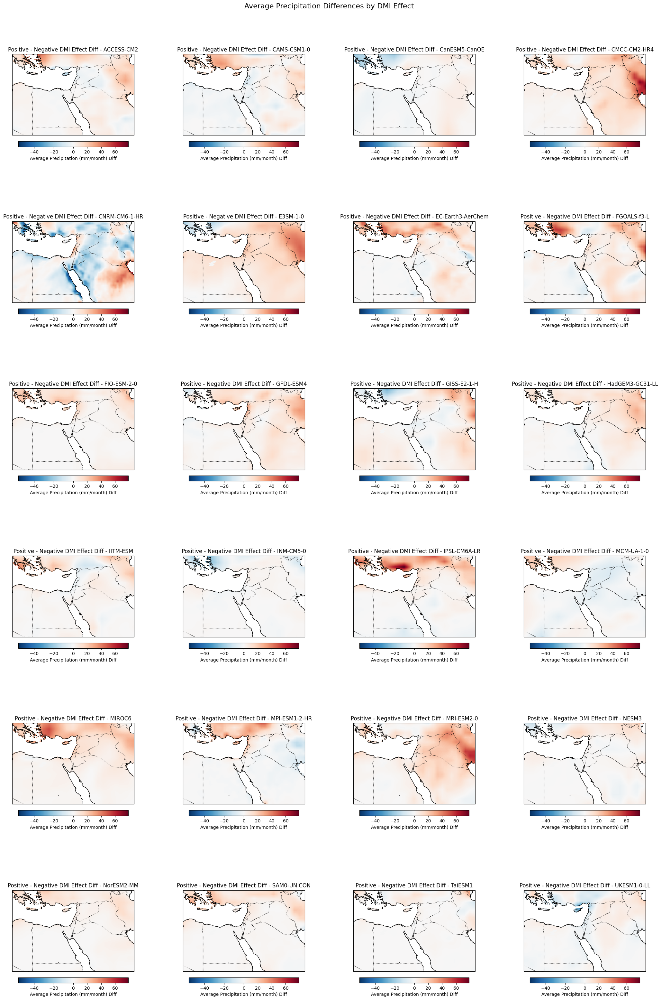

In [38]:
fig, axes = plt.subplots(6, 4, figsize=(20, 30), subplot_kw={'projection': ccrs.PlateCarree()})
fig.tight_layout()
mats = list(precip_diff_dmi.values())
titles = list(precip_diff_dmi.keys())

for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
    vis_helper.plot_diff_heatmap(ax, value, boundaries_middle_east, 'Average Precipitation (mm/month) Diff', f'Positive - Negative DMI Effect Diff - {key}', diff_range_precip)

fig.suptitle('Average Precipitation Differences by DMI Effect', fontsize=16, y=1.02)   
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

In [39]:
dmi_pos_neg_baseline = np.where(dmi_baseline >= 0, True, False)
precip_diff_dmi_baseline = helper.calc_iod_precp_effect(dmi_pos_neg_baseline, precip_baseline)

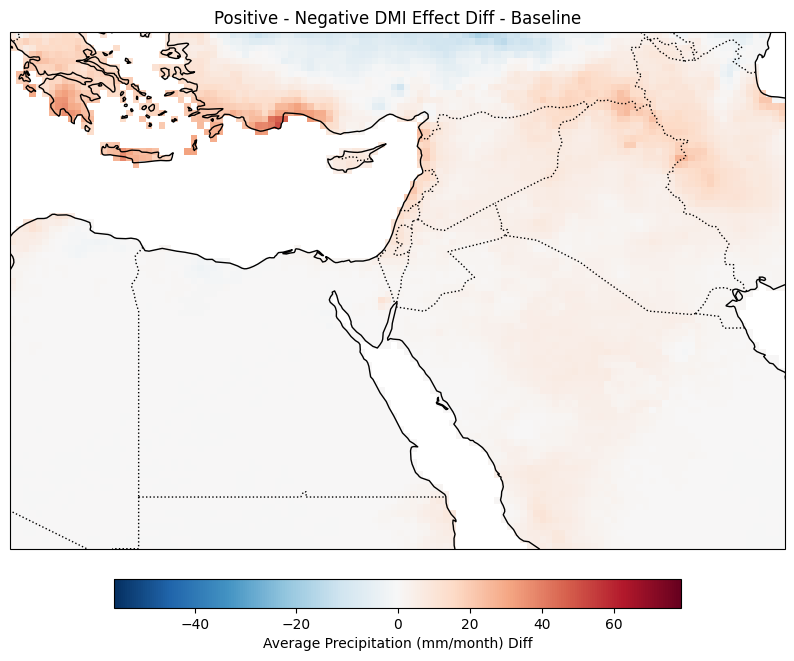

In [40]:
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
vis_helper.plot_diff_heatmap(ax, precip_diff_dmi_baseline, boundaries_middle_east, 'Average Precipitation (mm/month) Diff', f'Positive - Negative DMI Effect Diff - Baseline', diff_range_precip)

In [41]:
# wtio_pos_neg = {key: np.where(dmi_arr >= 0, True, False) for key, dmi_arr in wtio.items()}

In [42]:
# precip_diff_wtio = dict()
# for key in tqdm.tqdm(masked_precip.keys()):
#     diff_mat = helper.calc_iod_precp_effect(wtio_pos_neg[key], masked_precip[key])
#     precip_diff_wtio[key] = diff_mat

In [43]:
# fig, axes = plt.subplots(6, 4, figsize=(20, 30), subplot_kw={'projection': ccrs.PlateCarree()})
# fig.tight_layout()
# mats = list(precip_diff_wtio.values())
# titles = list(precip_diff_wtio.keys())

# for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
#     vis_helper.plot_precp_heatmap(ax, value, boundaries, 'Average Precipitation (mm/month) Diff', f'Positive - Negative WTIO Effect Diff - {key}', 0)
# plt.subplots_adjust(wspace=0.4, hspace=0.4)
# plt.show()

# DMI POS/NEG Effect on MSLP & GPH 500 

In [96]:
slp = helper.collect_all_datasets(SLP_path, 'slp')
gph = helper.collect_all_datasets(GPH500_path, 'gph500')

100%|█████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 213.99it/s]


psl_Amon_ACCESS-CM2_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
psl_Amon_CAMS-CSM1-0_historical_r1i1p1f1_gn_19811016-20101016_v20190708.nc
psl_Amon_CanESM5-CanOE_historical_r1i1p2f1_gn_19811016-20101016_v20190429.nc
psl_Amon_CMCC-CM2-HR4_historical_r1i1p1f1_gn_19811016-20101016_v20200904.nc
psl_Amon_CNRM-CM6-1-HR_historical_r1i1p1f2_gr_19811016-20101016_v20191021.nc
psl_Amon_E3SM-1-0_historical_r1i1p1f1_gr_19811016-20101016_v20190913.nc
psl_Amon_EC-Earth3-AerChem_historical_r1i1p1f1_gr_19811016-20101016_v20200624.nc
psl_Amon_FGOALS-f3-L_historical_r1i1p1f1_gr_19811016-20101016_v20190927.nc
psl_Amon_FIO-ESM-2-0_historical_r1i1p1f1_gn_19811016-20101016_v20191115.nc
psl_Amon_GFDL-ESM4_historical_r1i1p1f1_gr1_19811016-20101016_v20190726.nc
psl_Amon_HadGEM3-GC31-LL_historical_r1i1p1f3_gn_19811016-20101016_v20190624.nc
psl_Amon_IITM-ESM_historical_r1i1p1f1_gn_19811016-20101016_v20191226.nc
psl_Amon_INM-CM5-0_historical_r1i1p1f1_gr1_19811016-20101016_v20190610.nc
psl_Amon_MCM-UA-1-0

  0%|                                                                                                   | 0/23 [00:00<?, ?it/s]

zg_Amon_ACCESS-CM2_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
zg_Amon_CanESM5-CanOE_historical_r1i1p2f1_gn_19811016-20101016_v20190429.nc
zg_Amon_CMCC-CM2-HR4_historical_r1i1p1f1_gn_19811016-20101016_v20200904.nc
zg_Amon_CNRM-CM6-1-HR_historical_r1i1p1f2_gr_19811016-20101016_v20191021.nc
zg_Amon_E3SM-1-0_historical_r1i1p1f1_gr_19811016-20101016_v20191220.nc
zg_Amon_EC-Earth3-AerChem_historical_r1i1p1f1_gr_19811016-20101016_v20200624.nc
zg_Amon_FGOALS-f3-L_historical_r1i1p1f1_gr_19811016-20101016_v20190927.nc
zg_Amon_FIO-ESM-2-0_historical_r1i1p1f1_gn_19811016-20101016_v20191205.nc
zg_Amon_GFDL-ESM4_historical_r1i1p1f1_gr1_19811016-20101016_v20190726.nc
zg_Amon_GISS-E2-1-H_historical_r1i1p1f1_gn_19811016-20101016_v20190403.nc
zg_Amon_HadGEM3-GC31-LL_historical_r1i1p1f3_gn_19811016-20101016_v20190624.nc
zg_Amon_IITM-ESM_historical_r1i1p1f1_gn_19811016-20101016_v20191226.nc
zg_Amon_INM-CM5-0_historical_r1i1p1f1_gr1_19811016-20101016_v20190610.nc
zg_Amon_IPSL-CM6A-LR_historical_

100%|█████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 207.85it/s]

zg_Amon_NorESM2-MM_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
zg_Amon_SAM0-UNICON_historical_r1i1p1f1_gn_19811016-20101016_v20190323.nc
zg_Amon_TaiESM1_historical_r1i1p1f1_gn_19811016-20101016_v20200623.nc
zg_Amon_UKESM1-0-LL_historical_r1i1p1f2_gn_19811016-20101016_v20190406.nc


In [97]:
optionsinterp = {"interpolate": True,
           "force grid": False,
           "average": False}

options = {"interpolate": False,
           "force grid": False,
           "average": False}

In [98]:
slp1 = helper.slp_process(slp, target_dim=era5_dim, bounds_lat=bounds_general_lat, bounds_lon=bounds_general_lon, options=options)
slp_interp = helper.slp_process(slp, target_dim=era5_dim, bounds_lat=bounds_general_lat, bounds_lon=bounds_general_lon, options=optionsinterp)
gph = helper.gph_process(gph, target_dim=era5_dim, bounds_lat=bounds_general_lat, bounds_lon=bounds_general_lon, options=options)

In [99]:
slp1

{'ACCESS-CM2': masked_array(
   data=[[[102040.875, 102008.5  , 101970.44 , ..., 101724.19 ,
           101678.625, 101625.625],
          [101958.125, 101927.5  , 101891.75 , ..., 101657.5  ,
           101621.75 , 101581.875],
          [101877.19 , 101848.   , 101814.06 , ..., 101593.06 ,
           101568.125, 101539.875],
          ...,
          [101356.19 , 101281.875, 101233.625, ..., 102015.31 ,
           102000.31 , 101997.375],
          [101215.06 , 101140.44 , 101096.31 , ..., 102078.19 ,
           102073.06 , 102064.31 ],
          [101079.25 , 101005.19 , 100952.   , ..., 102147.625,
           102154.69 , 102140.625]],
 
         [[101918.69 , 101899.19 , 101872.56 , ..., 101700.94 ,
           101634.56 , 101558.81 ],
          [101856.19 , 101834.69 , 101806.5  , ..., 101622.375,
           101565.75 , 101501.69 ],
          [101789.56 , 101767.625, 101738.69 , ..., 101543.875,
           101495.25 , 101443.   ],
          ...,
          [101581.375, 101590.94 , 101

In [100]:
slp_interp

{'ACCESS-CM2': array([[[102040.875     , 102036.62578125, 102032.3765625 , ...,
          101639.5375    , 101632.58125   , 101625.625     ],
         [102024.62053571, 102020.41643415, 102016.21233259, ...,
          101630.26699219, 101623.64912109, 101617.03125   ],
         [102008.36607143, 102004.20708705, 102000.04810268, ...,
          101620.99648437, 101614.71699219, 101608.4375    ],
         ...,
         [101132.60491071, 101122.85520368, 101113.10549665, ...,
          102113.78864397, 102112.21686663, 102110.64508929],
         [101105.92745536, 101096.19225028, 101086.4570452 , ...,
          102129.05252511, 102127.34378488, 102125.63504464],
         [101079.25      , 101069.52929687, 101059.80859375, ...,
          102144.31640625, 102142.47070312, 102140.625     ]],
 
        [[101918.6875    , 101916.128125  , 101913.56875   , ...,
          101578.696875  , 101568.7546875 , 101558.8125    ],
         [101906.41071429, 101903.79977679, 101901.18883929, ...,
       

In [80]:
slp_effect = dict()
for key in tqdm.tqdm(slp.keys()):
    diff_mat = helper.calc_iod_slp_effect(dmi_pos_neg[key], slp[key])
    slp_effect[key] = diff_mat

100%|████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 2106.81it/s]


In [81]:
slp_effect_baseline = helper.calc_iod_slp_effect(dmi_pos_neg_baseline, mslp_baseline)

In [82]:
diff_range_slp = vis_helper.get_diff_range(slp_effect)

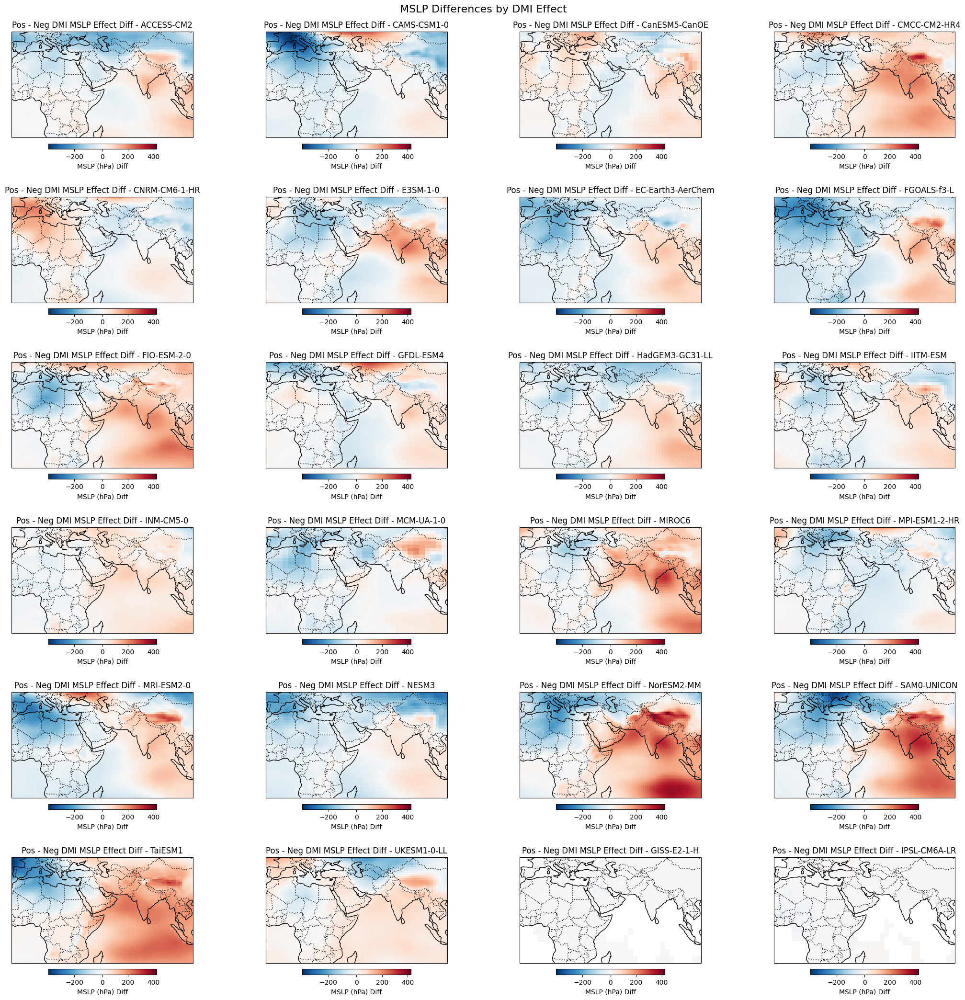

In [83]:
fig, axes = plt.subplots(6, 4, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
fig.tight_layout()
mats = list(slp_effect.values())
titles = list(slp_effect.keys())

for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
    vis_helper.plot_diff_heatmap(ax, value, boundaries_general, 'MSLP (hPa) Diff', f'Pos - Neg DMI MSLP Effect Diff - {key}', diff_range_slp)

fig.suptitle('MSLP Differences by DMI Effect', fontsize=16, y=1.02)       
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

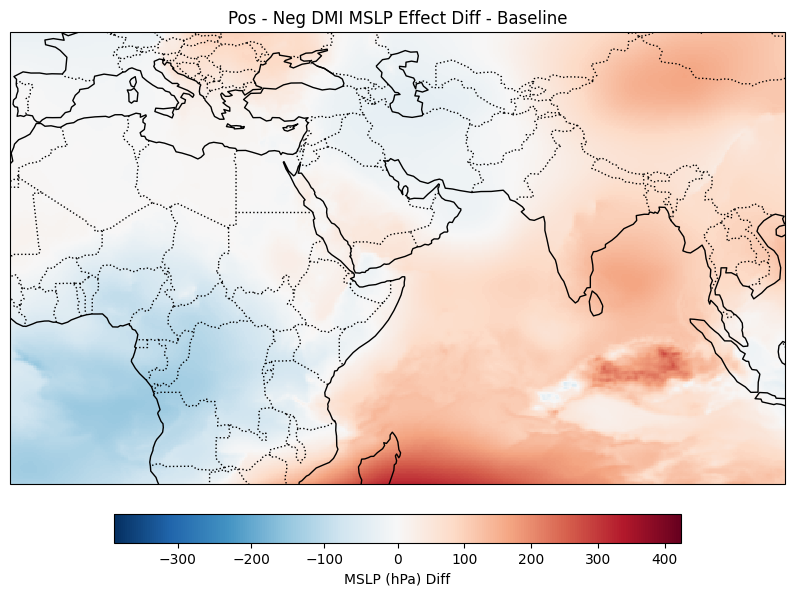

In [84]:
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
vis_helper.plot_diff_heatmap(ax, slp_effect_baseline, boundaries_general, 'MSLP (hPa) Diff', f'Pos - Neg DMI MSLP Effect Diff - Baseline', diff_range_slp)

In [52]:
gph_effect = dict()
for key in tqdm.tqdm(gph.keys()):
    diff_mat = helper.calc_iod_gph_effect(dmi_pos_neg[key], gph[key])
    gph_effect[key] = diff_mat

100%|█████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 128.61it/s]


In [85]:
gph_effect

{'ACCESS-CM2': array([[ 4.86920249,  4.86078825,  4.85237402, ...,  4.94493248,
          5.00905419,  5.0731759 ],
        [ 4.76125288,  4.75373499,  4.7462171 , ...,  4.86346688,
          4.92417045,  4.98487401],
        [ 4.65330327,  4.64668173,  4.64006019, ...,  4.78200129,
          4.8392867 ,  4.89657212],
        ...,
        [-8.39006823, -8.06062213, -7.73117604, ...,  3.33419911,
          3.36345175,  3.39270438],
        [-8.09293252, -7.76179808, -7.43066365, ...,  2.73265927,
          2.76176517,  2.79087107],
        [-7.7957968 , -7.46297403, -7.13015126, ...,  2.13111942,
          2.16007859,  2.18903775]]),
 'CanESM5-CanOE': array([[  8.72588031,   8.73850308,   8.75112585, ...,   2.87942753,
           2.88350886,   2.88759018],
        [  8.61037032,   8.62266701,   8.63496369, ...,   2.90141482,
           2.90523982,   2.90906481],
        [  8.49486033,   8.50683093,   8.51880153, ...,   2.92340211,
           2.92697077,   2.93053944],
        ...,
     

In [53]:
gph_effect_baseline = helper.calc_iod_gph_effect(dmi_pos_neg_baseline, gph500_baseline)

In [54]:
diff_range_gph = vis_helper.get_diff_range(gph_effect)

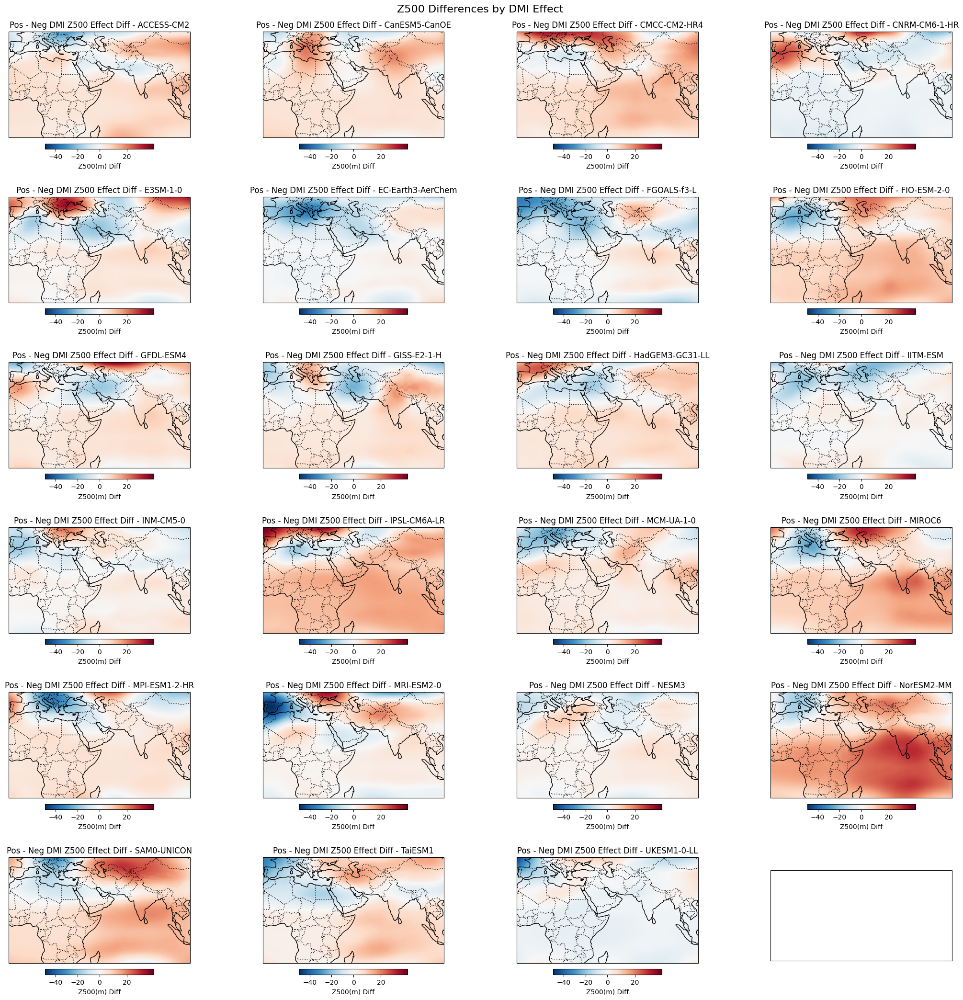

In [55]:
fig, axes = plt.subplots(6, 4, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
fig.tight_layout()
mats = list(gph_effect.values())
titles = list(gph_effect.keys())

for i, (ax, key, value) in enumerate(zip(axes.ravel(), titles, mats)):
    vis_helper.plot_diff_heatmap(ax, value, boundaries_general, 'Z500(m) Diff', f'Pos - Neg DMI Z500 Effect Diff - {key}', diff_range_gph)

fig.suptitle('Z500 Differences by DMI Effect', fontsize=16, y=1.02)
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

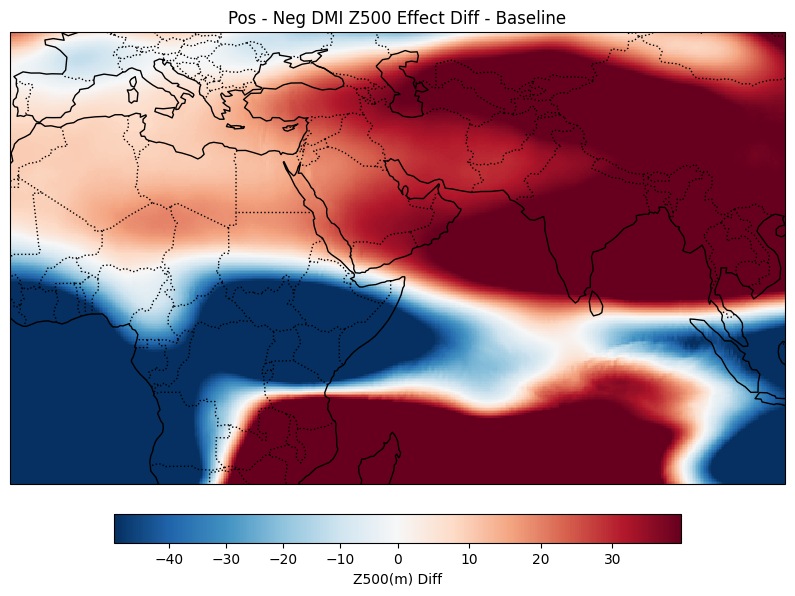

In [56]:
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
vis_helper.plot_diff_heatmap(ax, gph_effect_baseline, boundaries_general, 'Z500(m) Diff', f'Pos - Neg DMI Z500 Effect Diff - Baseline', diff_range_gph)

# SAL Scores

First, lets look at the sal scores for the correlations

In [57]:
domain_middle_east = np.where(np.isnan(tested_corr_baseline.data), 0, 1)
domain_general = np.ones(era5_dim)

In [58]:
sal_scores_corr = dict()
for key, value in tested_corrs.items():
    scores = helper.compute_SAL(value, tested_corr_baseline, domain_middle_east) # pysteps.verification.salscores.sal(value, tested_corr_baseline, thr_factor=1/15) # TODO - examine threshold choice
    sal_scores_corr[key] = scores
    print(f'{key} - {scores}')

ACCESS-CM2 - (-1.318629305566345, -1.520830511463023, 0.4857857805721395)
CAMS-CSM1-0 - (-1.5529721507296461, -1.6864576846415686, 0.17797890049446372)
CanESM5-CanOE - (-0.5837187577479823, -0.6951213048507617, 0.22013496607901994)
CMCC-CM2-HR4 - (-0.47645686788886543, -0.6605857716547416, 0.39552379045691644)
CNRM-CM6-1-HR - (-1.7398212382744611, -2.0, 0.33415548599669964)
E3SM-1-0 - (-0.10263908768291827, -0.1817808579872909, 0.28969703614887776)
EC-Earth3-AerChem - (-1.010328887200762, -1.2206815066309438, 0.14699455016961138)
FGOALS-f3-L - (-0.806037241536386, -1.0586266565604954, 0.13227593166492346)
FIO-ESM-2-0 - (-0.9158238947203109, -1.1445163734581045, 0.3920918572568146)
GFDL-ESM4 - (-0.45949127608634316, -0.6584651021493608, 0.32501379441962897)
GISS-E2-1-H - (-0.5194543589846489, -0.8541317110847491, 0.3264445049815917)
HadGEM3-GC31-LL - (-0.24041723825686273, -0.4842322499271603, 0.31909202580923707)
IITM-ESM - (-1.6989214935113552, -1.7902345655898997, 0.2011535449151089)

In [59]:
from adjustText import adjust_text

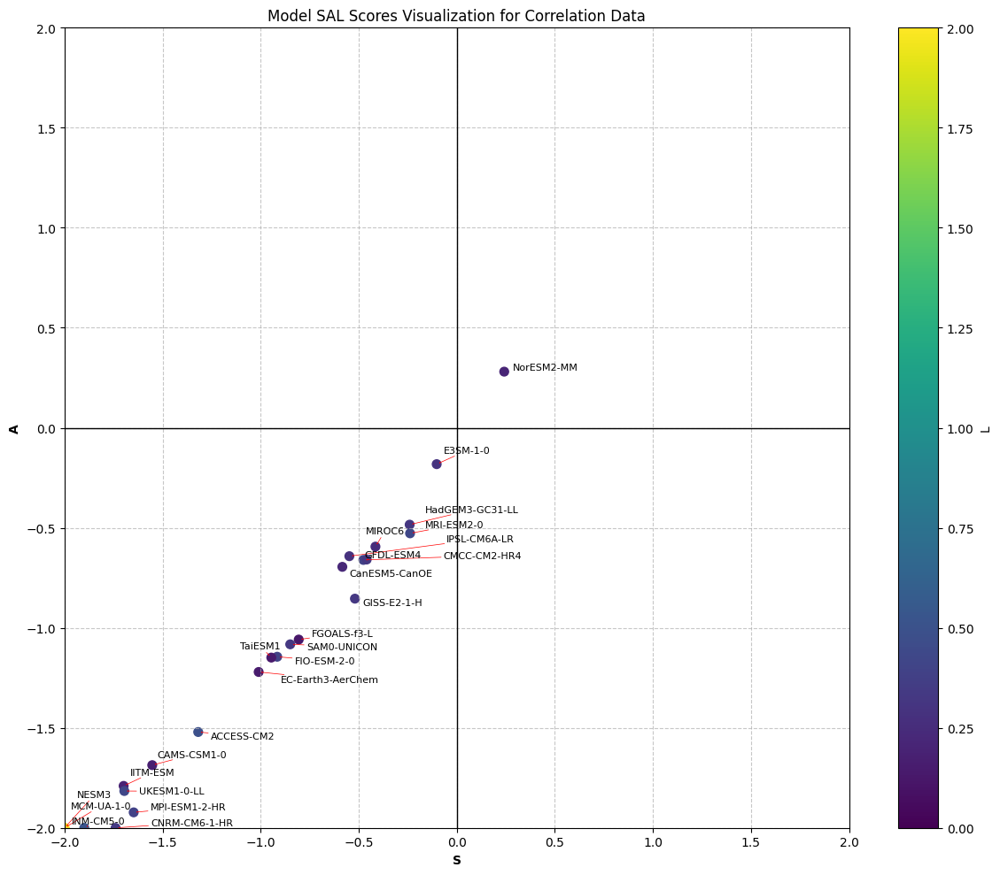

In [60]:
vis_helper.plot_SAL(sal_scores_corr,'Model SAL Scores Visualization for Correlation Data')

Now we would like to look at the SAL scores for the other graphs we created - DMI effect on MSLP, GPH 500 and POS/NEG precipitation, as well as overall precipitation. First, lets retrieve the precipitation data, this time averaged.

In [61]:
options = {"interpolate": True,
           "force grid": False,
           "average": True}
precip_data  = helper.collect_all_datasets(precipitation_path, 'precip', chirps_dim, unit_conversion, bounds_middle_east_lat, bounds_middle_east_lon, options)

  8%|███████▌                                                                                   | 2/24 [00:00<00:01, 16.07it/s]

pr_Amon_ACCESS-CM2_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
(16, 16)
pr_Amon_CAMS-CSM1-0_historical_r1i1p1f1_gn_19811016-20101016_v20190708.nc
(18, 27)
pr_Amon_CanESM5-CanOE_historical_r1i1p2f1_gn_19811016-20101016_v20190429.nc
(7, 10)
pr_Amon_CMCC-CM2-HR4_historical_r1i1p1f1_gn_19811016-20101016_v20200904.nc
(21, 25)
pr_Amon_CNRM-CM6-1-HR_historical_r1i1p1f2_gr_19811016-20101016_v20191021.nc


 33%|██████████████████████████████▎                                                            | 8/24 [00:00<00:00, 21.90it/s]

(40, 61)
pr_Amon_E3SM-1-0_historical_r1i1p1f1_gr_19811016-20101016_v20190913.nc
(20, 30)
pr_Amon_EC-Earth3-AerChem_historical_r1i1p1f1_gr_19811016-20101016_v20200624.nc
(28, 43)
pr_Amon_FGOALS-f3-L_historical_r1i1p1f1_gr_19811016-20101016_v20190927.nc
(20, 24)
pr_Amon_FIO-ESM-2-0_historical_r1i1p1f1_gn_19811016-20101016_v20191209.nc
(21, 25)
pr_Amon_GFDL-ESM4_historical_r1i1p1f1_gr1_19811016-20101016_v20190726.nc
(20, 24)


 71%|███████████████████████████████████████████████████████████████▊                          | 17/24 [00:00<00:00, 32.33it/s]

pr_Amon_GISS-E2-1-H_historical_r1i1p1f1_gn_19811016-20101016_v20190403.nc
(10, 12)
pr_Amon_HadGEM3-GC31-LL_historical_r1i1p1f3_gn_19811016-20101016_v20190624.nc
(16, 16)
pr_Amon_IITM-ESM_historical_r1i1p1f1_gn_19811016-20101016_v20191226.nc
(10, 16)
pr_Amon_INM-CM5-0_historical_r1i1p1f1_gr1_19811016-20101016_v20190610.nc
(14, 16)
pr_Amon_IPSL-CM6A-LR_historical_r1i1p1f1_gr_19811016-20101016_v20180803.nc
(16, 13)
pr_Amon_MCM-UA-1-0_historical_r1i1p1f2_gn_19811017-20101017_v20191017.nc
(9, 8)
pr_Amon_MIROC6_historical_r1i1p1f1_gn_19811016-20101016_v20181212.nc
(15, 21)
pr_Amon_MPI-ESM1-2-HR_historical_r1i1p1f1_gn_19811016-20101016_v20190710.nc
(22, 32)


100%|██████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 28.01it/s]

pr_Amon_MRI-ESM2-0_historical_r1i1p1f1_gn_19811016-20101016_v20190222.nc
(18, 27)
pr_Amon_NESM3_historical_r1i1p1f1_gn_19811016-20101016_v20190630.nc
(10, 16)
pr_Amon_NorESM2-MM_historical_r1i1p1f1_gn_19811016-20101016_v20191108.nc
(21, 25)
pr_Amon_SAM0-UNICON_historical_r1i1p1f1_gn_19811016-20101016_v20190323.nc
(21, 25)
pr_Amon_TaiESM1_historical_r1i1p1f1_gn_19811016-20101016_v20200623.nc
(21, 25)
pr_Amon_UKESM1-0-LL_historical_r1i1p1f2_gn_19811016-20101016_v20190406.nc
(16, 16)


Next, lets see our results for each type of graph.

In [62]:
precip_data_for_sal = {}
for key, value in precip_data.items():
    precip_data_for_sal[key] = value[0]

In [63]:
sal_scores_precip = {}
sal_scores_pos_neg = {}
sal_scores_mslp = {}
sal_scores_gph500 = {}
domains = [domain_middle_east, domain_middle_east, domain_general, domain_general]
baselines = [np.mean(precip_baseline, axis=0), precip_diff_dmi_baseline, slp_effect_baseline, gph_effect_baseline]
sal_scores = [sal_scores_precip, sal_scores_pos_neg, sal_scores_mslp, sal_scores_gph500]
names = ['Precipitation', 'DMI effect on POS', 'DMI effect on MSLP', 'DMI effect on Z500']
sal_data = [precip_data_for_sal, precip_diff_dmi, slp_effect, gph_effect]

In [64]:
slp_effect['ACCESS-CM2'].shape

(281, 481)

In [65]:
for i in range(len(sal_data)):
    print(i)
    for key, value in sal_data[i].items():
        scores = helper.compute_SAL(value, baselines[i], domains[i]) # pysteps.verification.salscores.sal(value, tested_corr_baseline, thr_factor=1/15) # TODO - examine threshold choice
        sal_scores[i][key] = scores

0
1
2
3


Now lets see the results:

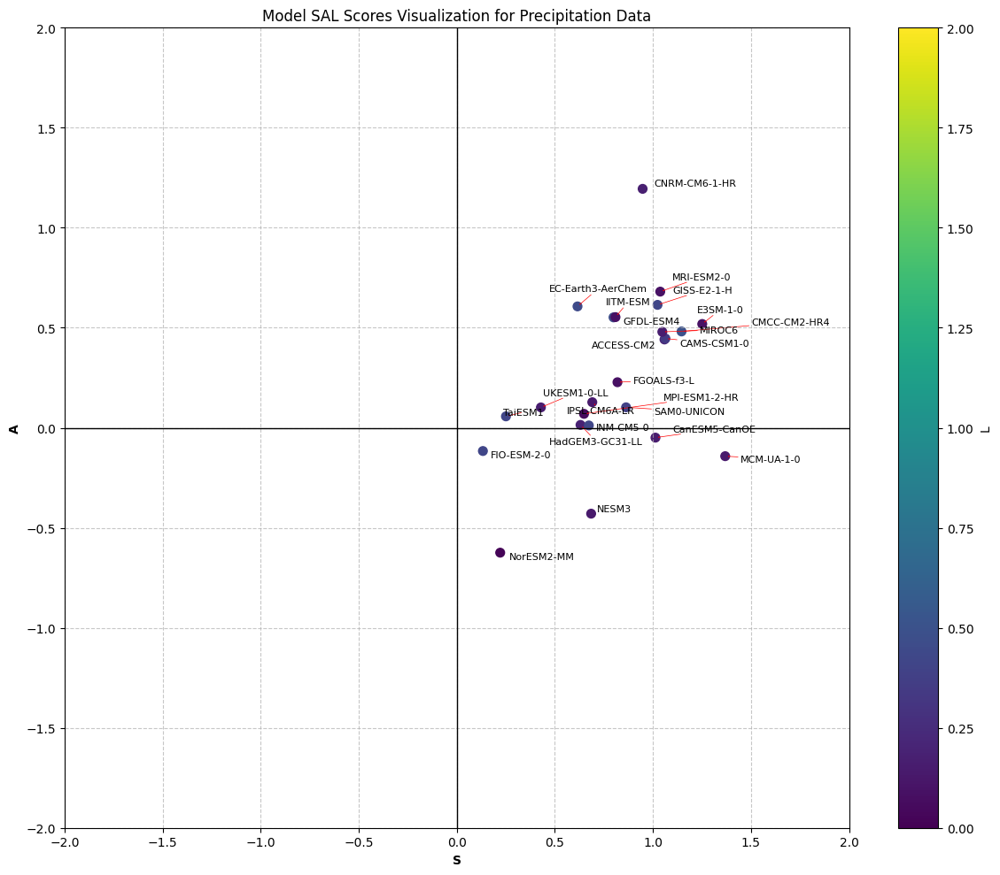

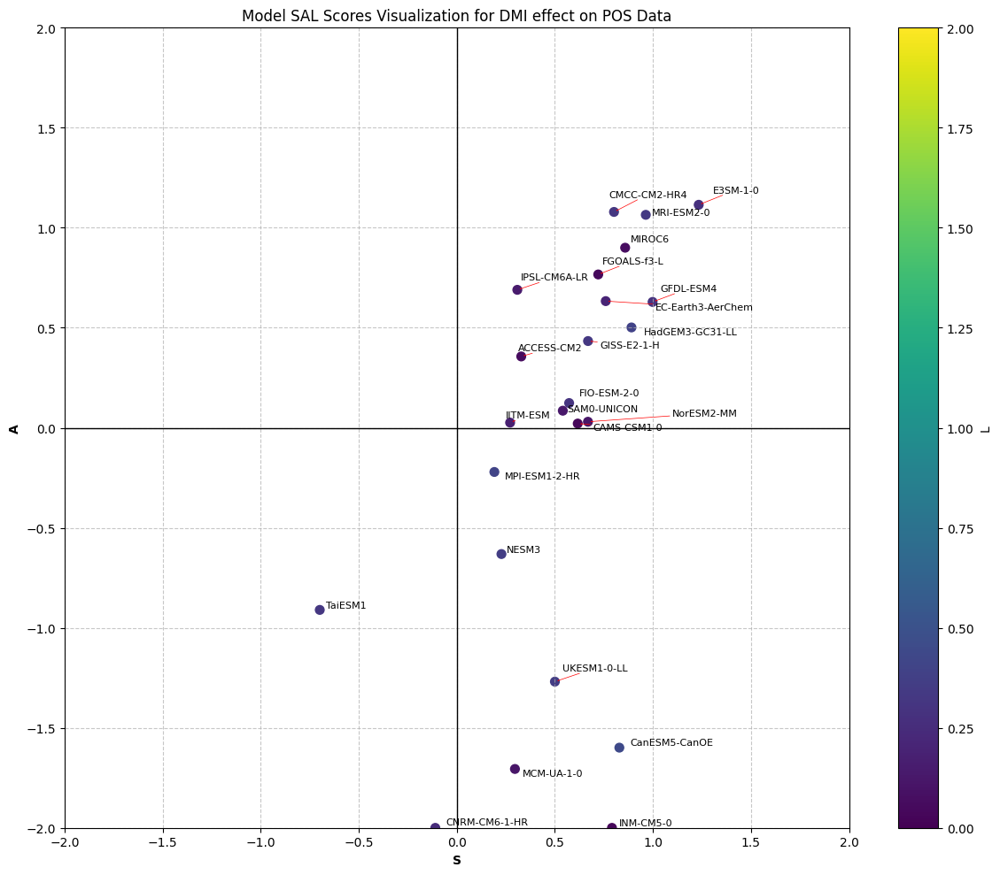

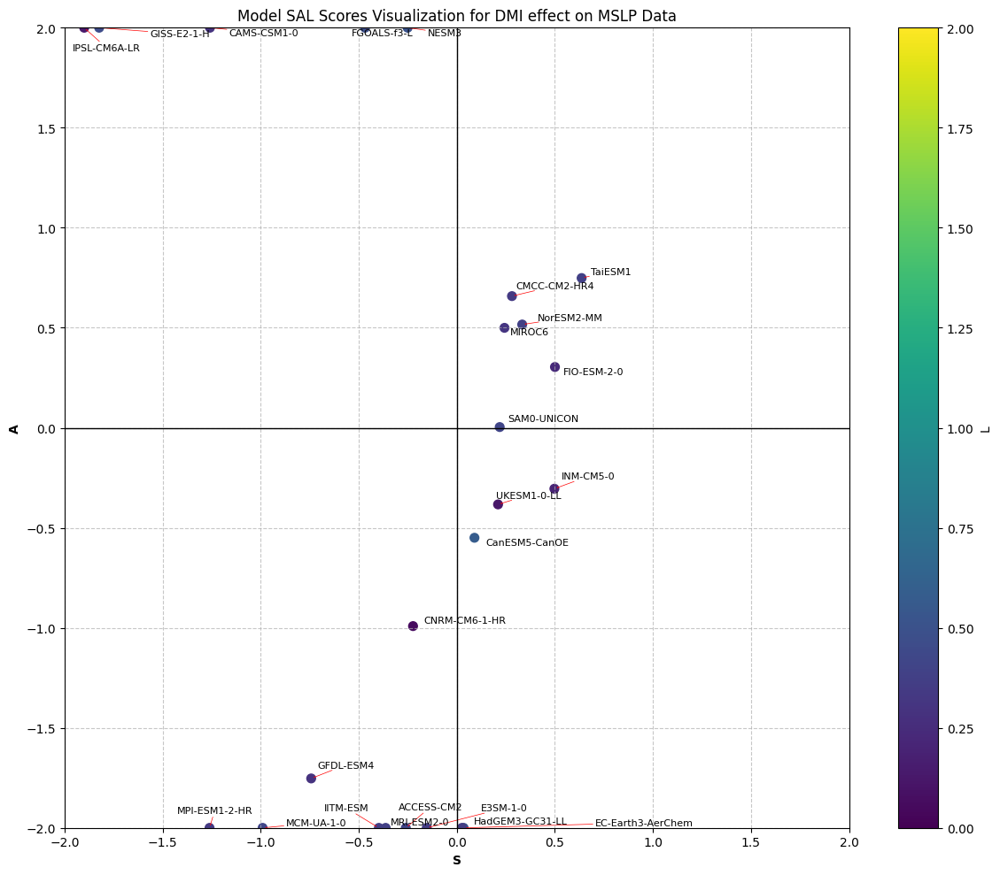

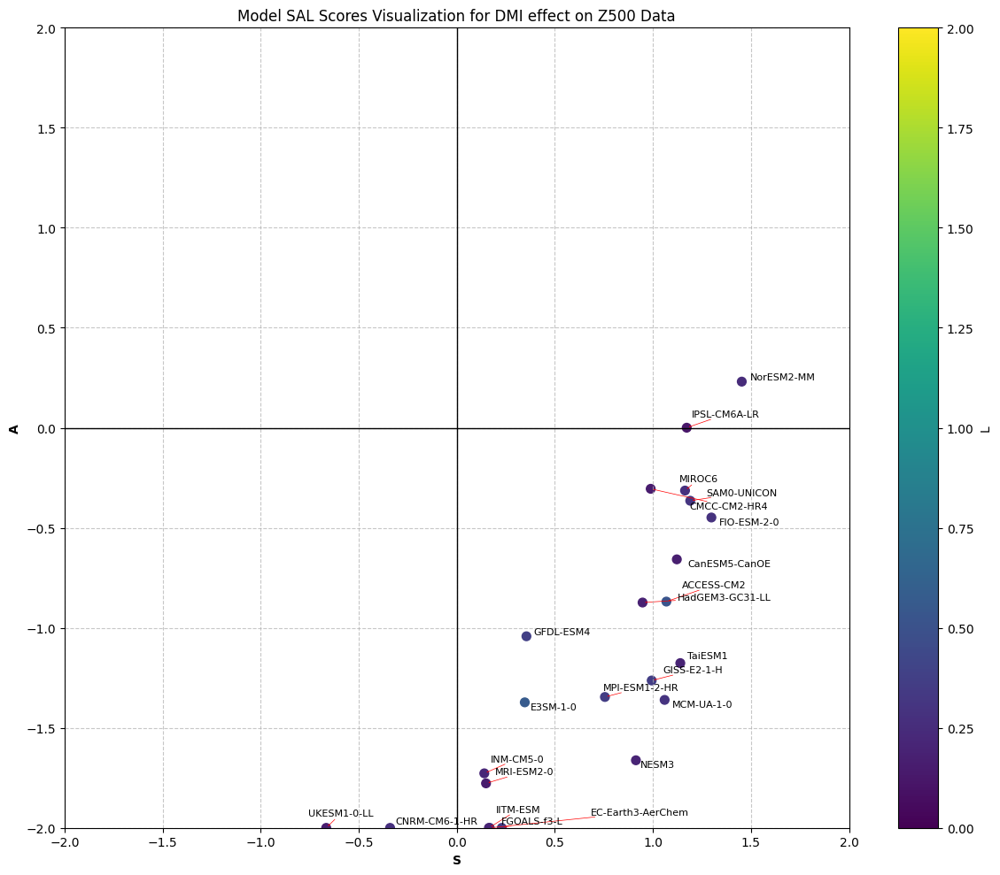

In [74]:
for i, scores in enumerate(sal_scores):
    vis_helper.plot_SAL(scores,f'Model SAL Scores Visualization for {names[i]} Data')

Finally, we want to visualize the results in a compact table. We would look both at the averaged component of each model, and at a breakdown of each model over all 5 different SAL breakdowns

In [110]:
sal_scores = [sal_scores_corr, sal_scores_precip, sal_scores_pos_neg, sal_scores_mslp, sal_scores_gph500]

In [131]:
averaged_sal_scores = {}
for key, value in sal_scores[0].items():
#     try:
    s = np.mean([sal_scores[i][key][0] for i in range(len(sal_scores)) if key in sal_scores[i]])
    a = np.mean([sal_scores[i][key][1] for i in range(len(sal_scores)) if key in sal_scores[i]])
    l = np.mean([sal_scores[i][key][2] for i in range(len(sal_scores)) if key in sal_scores[i]])
#     except KeyError ke:
    averaged_sal_scores[key] = (s, a, l)

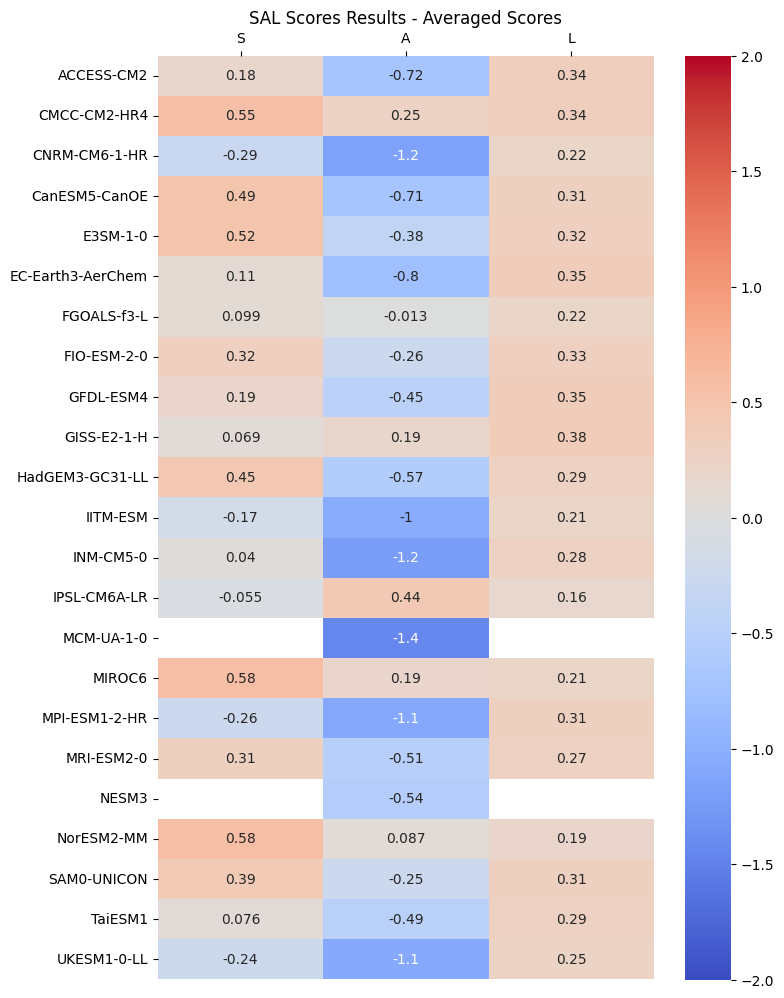

In [132]:
vis_helper.create_agg_SAL_table(averaged_sal_scores)

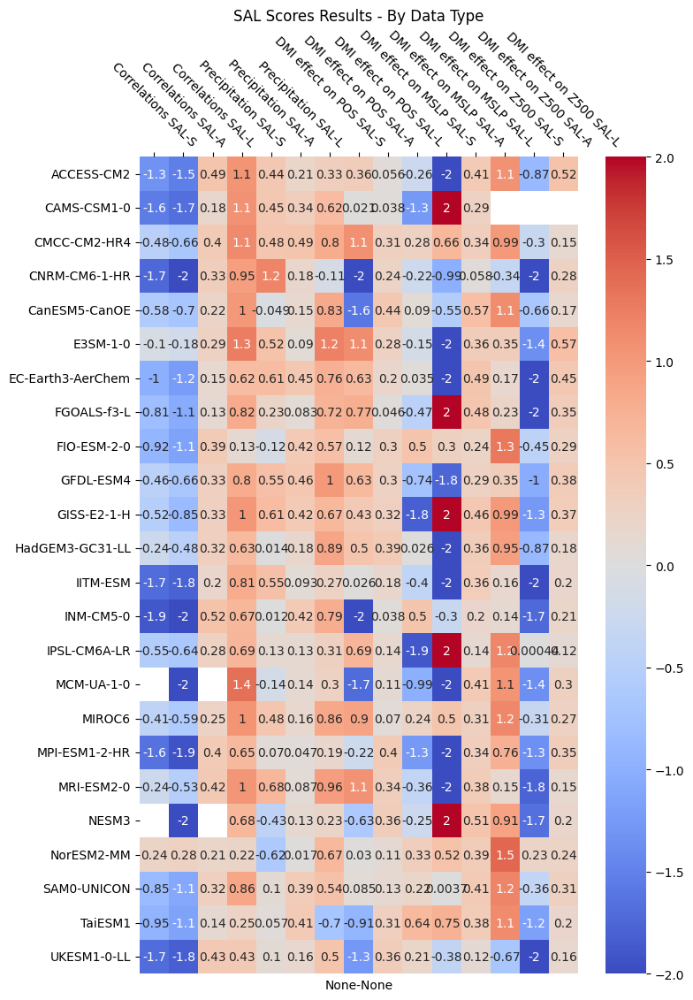

In [128]:
vis_helper.create_verbose_SAL_table(sal_scores[0], sal_scores[1], sal_scores[2], sal_scores[3], sal_scores[4])

In [67]:
res =pd.DataFrame(sal_scores_corr, index=["S", "A", "L"]).T

In [68]:
# sort res by index
res.sort_index(inplace=True)

In [69]:
def make_pretty(styler):
    styler.set_caption("Weather Conditions")
#     styler.format(rain_condition)
#     styler.format_index(lambda v: v.strftime("%A"))
    styler.background_gradient(axis=None, vmin=-2, vmax=2, cmap="tab20c")
    return styler

In [70]:
res.style.pipe(make_pretty)

,S,A,L
ACCESS-CM2,-1.318629,-1.520831,0.485786
CAMS-CSM1-0,-1.552972,-1.686458,0.177979
CMCC-CM2-HR4,-0.476457,-0.660586,0.395524
CNRM-CM6-1-HR,-1.739821,-2.000000,0.334155
CanESM5-CanOE,-0.583719,-0.695121,0.220135
E3SM-1-0,-0.102639,-0.181781,0.289697
EC-Earth3-AerChem,-1.010329,-1.220682,0.146995
FGOALS-f3-L,-0.806037,-1.058627,0.132276
FIO-ESM-2-0,-0.915824,-1.144516,0.392092
GFDL-ESM4,-0.459491,-0.658465,0.325014
